In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks

cufflinks.go_offline()

In [2]:
df_turnstiles = pd.read_parquet('../data/preprocessed/turnstiles_daily.parquet.gzip')
df_turnstiles.shape

(12060673, 7)

In [3]:
df_turnstiles.head(5)

,,entries,exits,station,linename,division,remote,ca
turnstile,time,,,,,,,
A002-R051-02-00-00,2015-01-01,429.0,149.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-00-01,2015-01-01,375.0,88.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-00,2015-01-01,210.0,621.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-01,2015-01-01,550.0,838.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-02,2015-01-01,497.0,623.0,LEXINGTON AV,NQR456,BMT,R051,A002


## Exploratory Data Analysis

Now that I preprocessed data properly, I can start analyzing it to check features and guide me through modelling process. Moreover, data has a hierarchical structure, where we can aggregate data in total node, by division, by station, by remote and then by turnstile. (We could also use city's region such as Brooklyn, Manhattan, etc.)

So I will follow a top-down approach initally, where I analyze total level first, and then go down the tree path. Also, even though I resampled data to a daily basis, I will likely do it again for a weekly or monthly basis so I can fit models in a reliable time.

### Total Series

In [4]:
df_total = df_turnstiles.groupby('time').sum()
df_total.head(5)

,entries,exits
time,,
2010-04-17,1899695.0,1562662.0
2010-04-18,2836288.0,2432109.0
2010-04-19,4451899.0,3532861.0
2010-04-20,5490683.0,4371280.0
2010-04-21,5599511.0,4453976.0


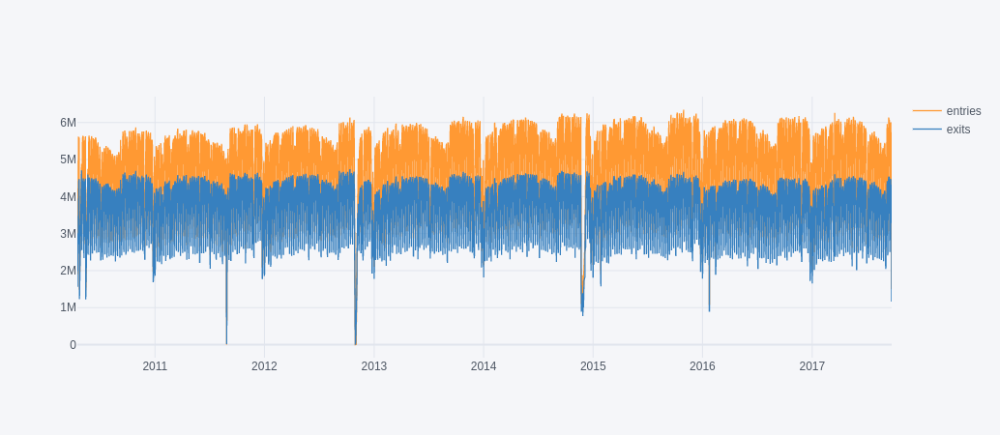

In [5]:
df_total.iplot()

For each plot I will analyze a few things in my data:
 - Check for trend.
 - Check for seasonality.
 - Outliers.
 - Cycles.
 - Variance.
 - Abrupt changes.
 
They are important aspects of any time series and will be useful to check in a visual manner. Notice that a few assumptions will need to be further investigate through statistical methods.

So in total series above, we have:
 - No apparent trend.
 - Strong seasonality. At least weekly seasonality, I need to verify using other plots to see higher frequencies.
 - A few huge drops show outliers.
 - No obvious cycle.
 - Variance of data seems constant over time, this is an important aspect.
 - No visible abrupt change occurred during data collection.
 
I can use rolling averages and standard deviation to check series' behavior.

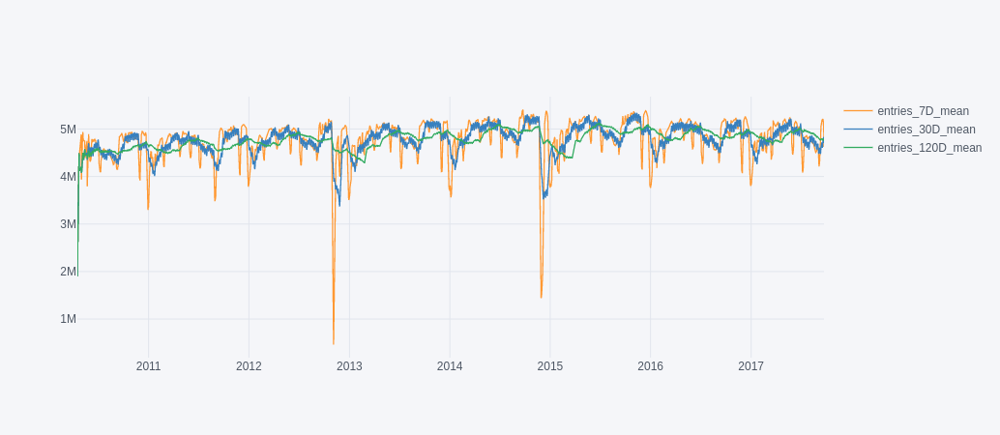

In [6]:
def compute_rollings(df, rolls, func, name):
    df_rolls = list()
    for roll in rolls:
        df_rolls.append(df.rolling(roll).agg(func).to_frame(name=f"{name}_{roll}_{func}"))
        
    return pd.concat(df_rolls, axis=1)

df_rolls_entries = compute_rollings(df_total['entries'], ['7D', '30D', '120D'], 'mean', name='entries')
df_rolls_entries.iplot()

If you select each series you can see them individually. 

On 7-day moving average, we can see that we also have a seasonality for each month. 
On 30-day moving average, we can see that series' level drop off considerably around January and September for each year. With peaks in november.
The long-run for 120-days moving avergae shows more stable series overall, this is crucial to confirm that it does not have a clear trend, and it is likely that with have a cycle, since we have a pattern of two drops, but is it too little evidence to infer something here. But for economic reasons, I would consider this series to have a cycle components as well or a strong correlation with employment rates.

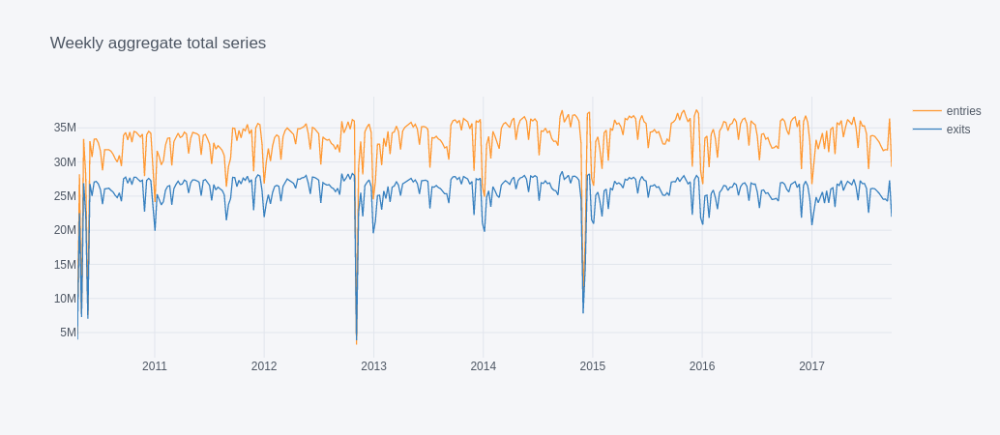

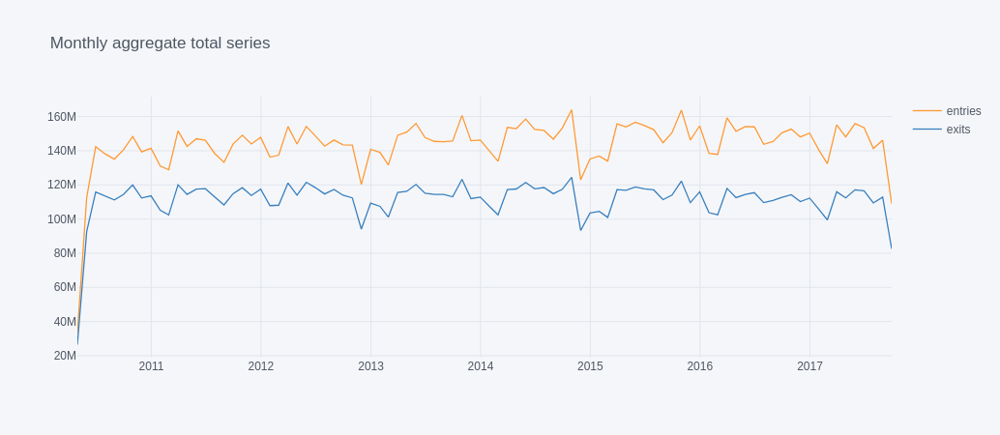

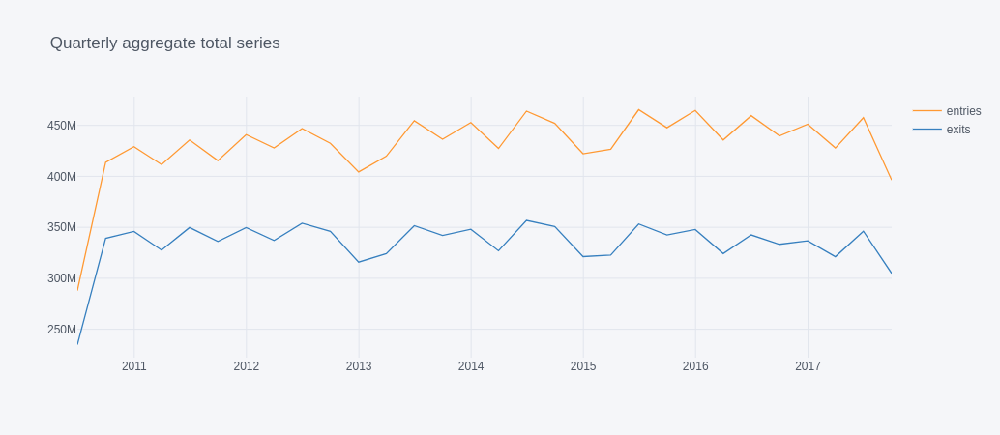

In [7]:
df_total.resample('W').sum().iplot(title="Weekly aggregate total series")
df_total.resample('M').sum().iplot(title="Monthly aggregate total series")
df_total.resample('Q').sum().iplot(title="Quarterly aggregate total series")

Above we have total series aggregated by week, month and quarter periods. We can see less noise overall. Also, november huge low levels are outliers, things that didn't happen in all years, maybe we need to treat data accordingly. Let's see by weekday and month the average number of users using subway.

<AxesSubplot:xlabel='day_name', ylabel='entries'>

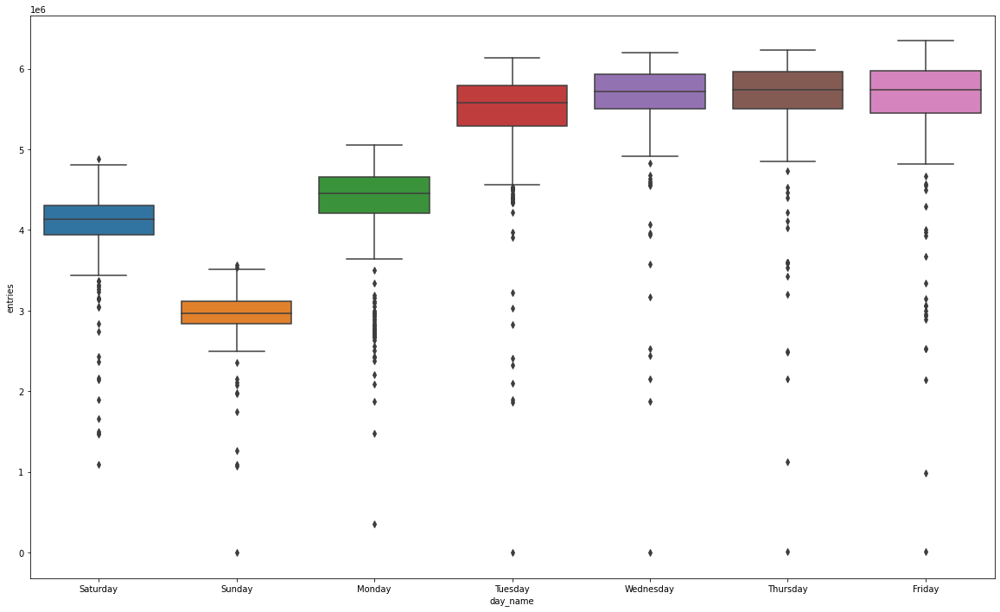

In [8]:
fig, ax = plt.subplots(figsize=(20, 12))

df_total = (
    df_total
        .assign(day_name=lambda df: df.index.get_level_values('time').day_name(),
                year=lambda df: df.index.get_level_values('time').year,
                month_name=lambda df: df.index.get_level_values('time').month_name())
)
sns.boxplot(x='day_name', y='entries', data=df_total, ax=ax)

In the plot above we have a boxplot for each day of the week in total series. We can see that Tuesday-Friday levels are almost the same and drops at weekends and, curiously, mondays. Also, these values are really close to the ones supplied by mta: http://web.mta.info/nyct/facts/ridership/#intro_s, indicating again that we have the right information.

<AxesSubplot:xlabel='year', ylabel='entries'>

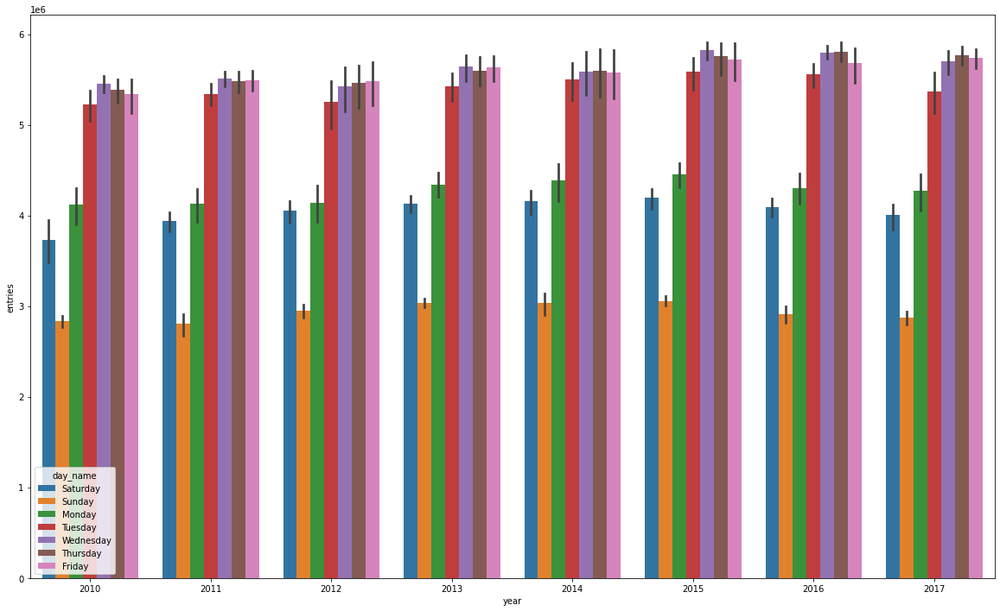

In [9]:
fig, ax = plt.subplots(figsize=(20, 12))

sns.barplot(hue='day_name', y='entries', x='year', data=df_total, ax=ax)

Plot above confirms that for year-to-year we don't have a meaningful difference.

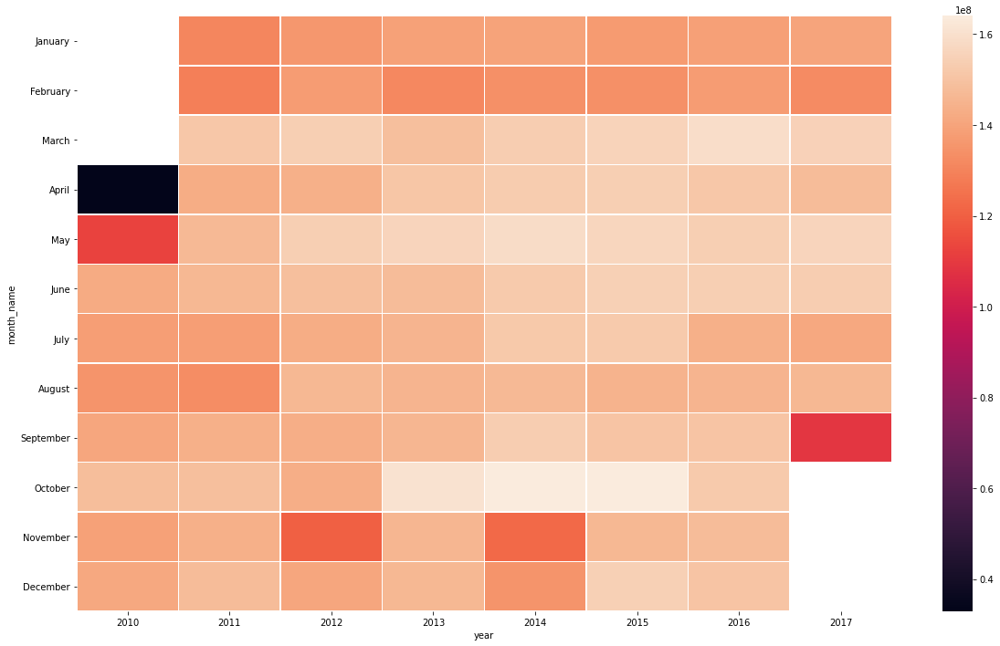

In [12]:
fig, ax = plt.subplots(figsize=(20, 12))

months = ["January", "February", "March", "April", "May", "June", 
          "July", "August", "September", "October", "November", "December"]

df_total['month_name'] = pd.Categorical(df_total['month_name'], categories=months, ordered=True)
totals_month_year = df_total.groupby(['year', 'month_name'])['entries'].agg(['sum']).unstack(level='year')

sns.heatmap(totals_month_year['sum'], annot=False, fmt=".0f", linewidths=.5, ax=ax);

We can see brighter areas around March-May and October (2013-2015), but we can see that monthly patterns are not so evident, although overall they tend to follow level of users year-to-year, sometimes unexpected drops may occur.

## Station Series

We can also aggregate our series by station, in this data, the second level in our hierarchy. Let's check how this data is distributed.

In [13]:
df_turnstiles.head(5)

,,entries,exits,station,linename,division,remote,ca
turnstile,time,,,,,,,
A002-R051-02-00-00,2015-01-01,429.0,149.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-00-01,2015-01-01,375.0,88.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-00,2015-01-01,210.0,621.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-01,2015-01-01,550.0,838.0,LEXINGTON AV,NQR456,BMT,R051,A002
A002-R051-02-03-02,2015-01-01,497.0,623.0,LEXINGTON AV,NQR456,BMT,R051,A002


In [14]:
df_station = df_turnstiles.groupby(['station', 'time']).sum()
df_station.head(5)

entries    exits
station time                        
1 AV    2010-04-17   8179.0   9088.0
        2010-04-18  16000.0  18251.0
        2010-04-19  17089.0  20426.0
        2010-04-20  20355.0  22335.0
        2010-04-21  20858.0  22726.0

Which stations have higher counts of users?

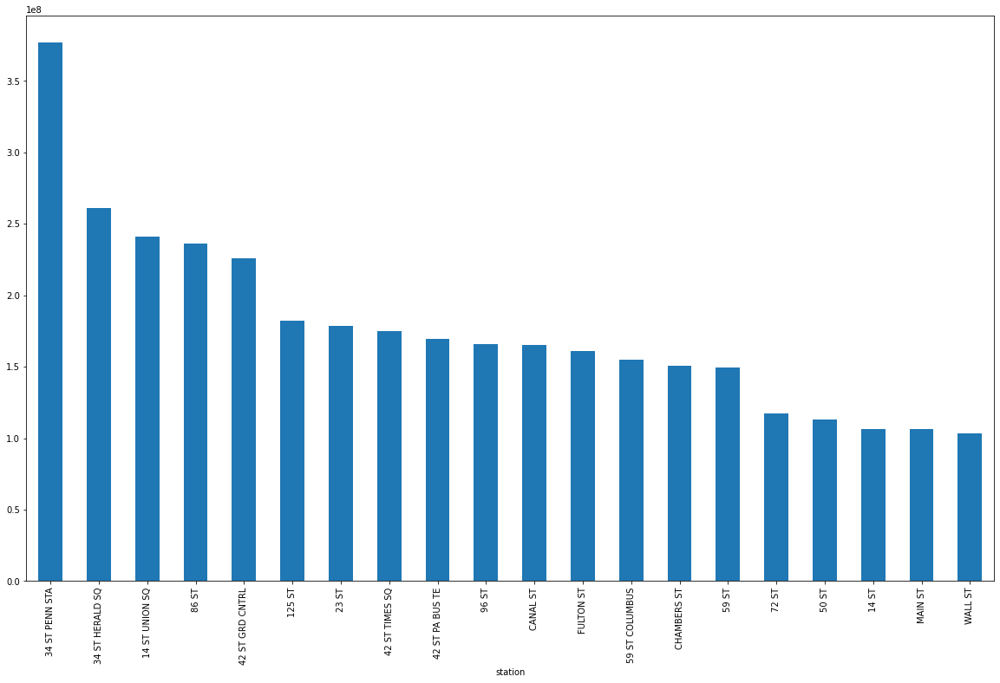

In [15]:
df_station.groupby(['station'])['entries'].sum().nlargest(20).plot(kind='bar', figsize=(20, 12));

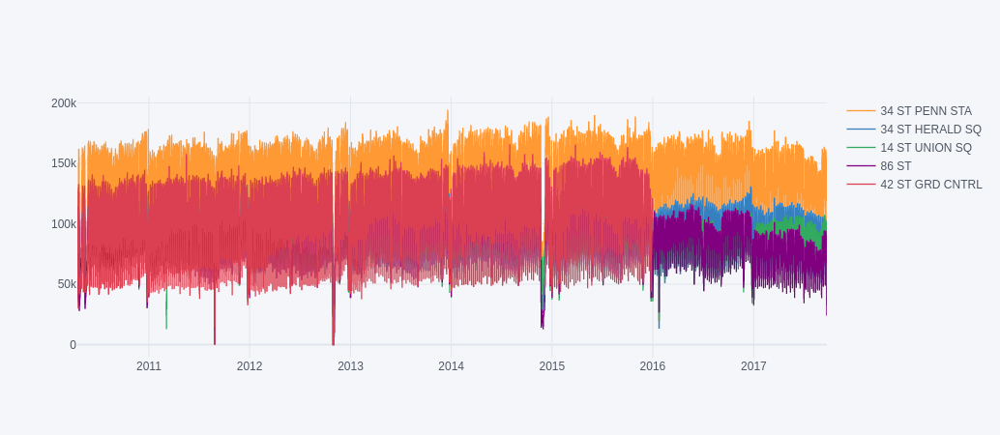

In [16]:
top_5_stations = df_station.groupby(['station'])['entries'].sum().nlargest(5).index.tolist()

df_station.loc[top_5_stations]['entries'].unstack(level='station').iplot()

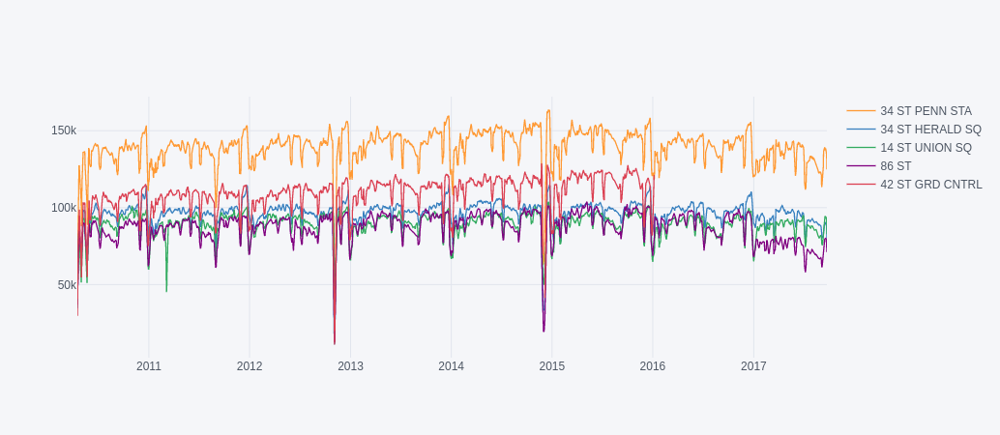

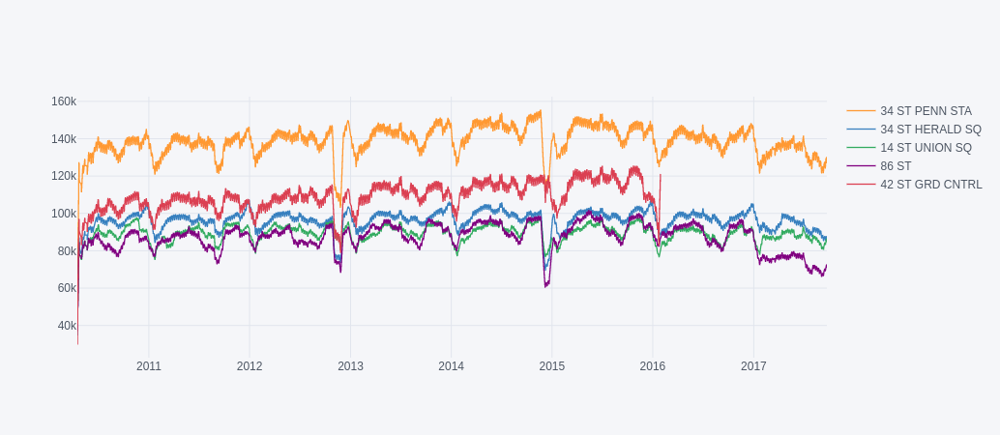

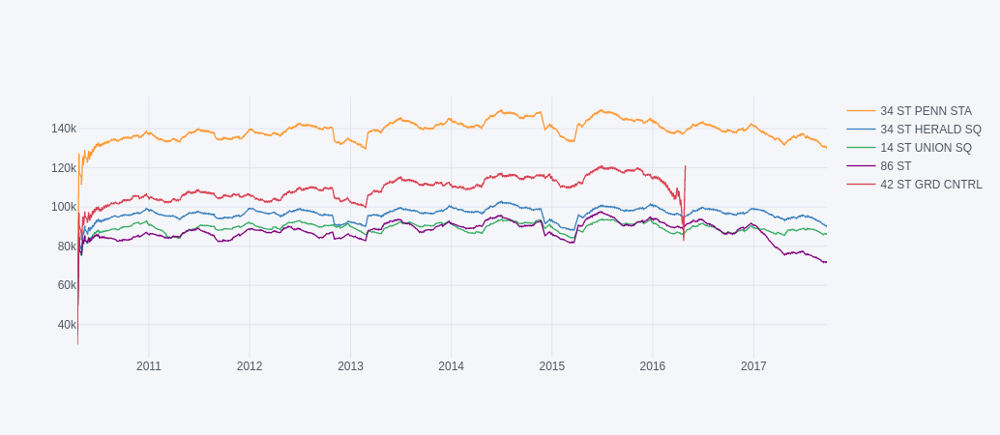

In [17]:
df_station.loc[top_5_stations]['entries'].unstack(level='station').rolling('7D').mean().iplot()
df_station.loc[top_5_stations]['entries'].unstack(level='station').rolling('30D').mean().iplot()
df_station.loc[top_5_stations]['entries'].unstack(level='station').rolling('120D').mean().iplot()

From the five top stations, overall they are quite similar. Notice that 42 ST GRD CNTRL does not have data after April 2016. This may occur due station name changing.

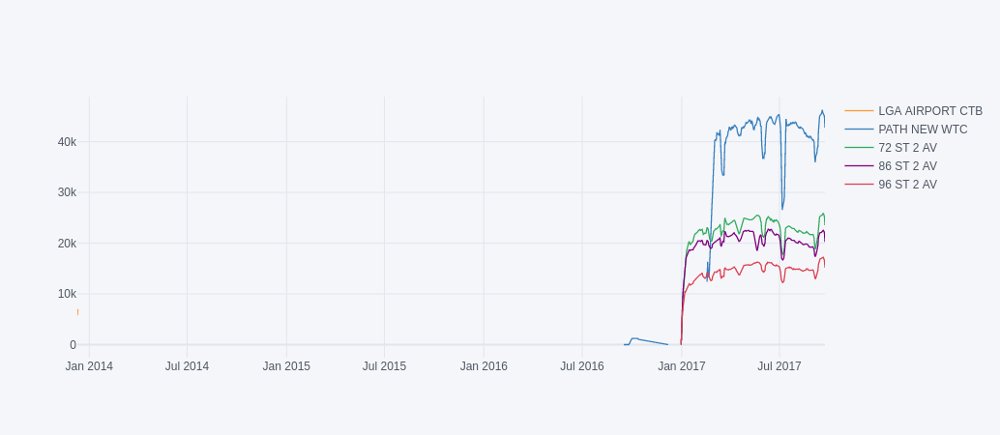

In [18]:
bottom_5_stations = df_station.groupby(['station']).count()['entries'].nsmallest(5).index.tolist()
df_station.loc[bottom_5_stations]['entries'].unstack(level='station').sort_index().rolling('7D').mean().iplot()
# df_station.loc[bottom_5_stations]['entries'].unstack(level='station').rolling('30D').mean().iplot()
# df_station.loc[bottom_5_stations]['entries'].unstack(level='station').rolling('120D').mean().iplot()

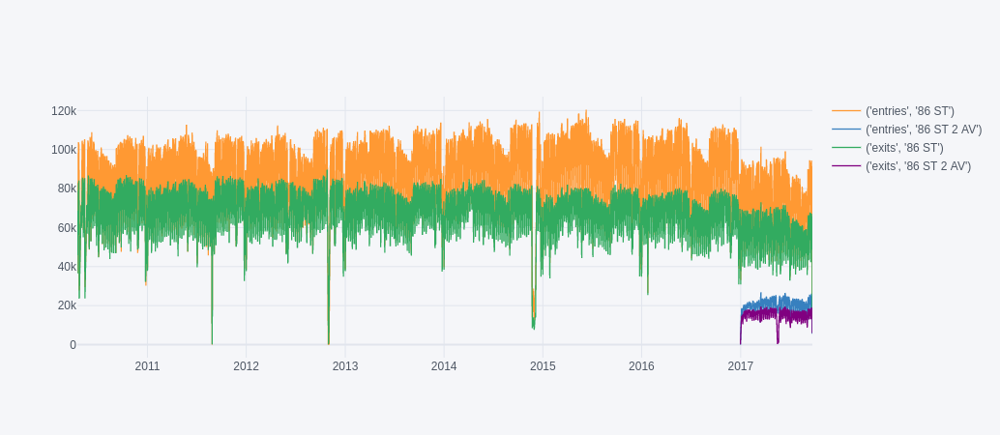

In [19]:
df_station.loc[['86 ST','86 ST 2 AV']].unstack(level='station').iplot()

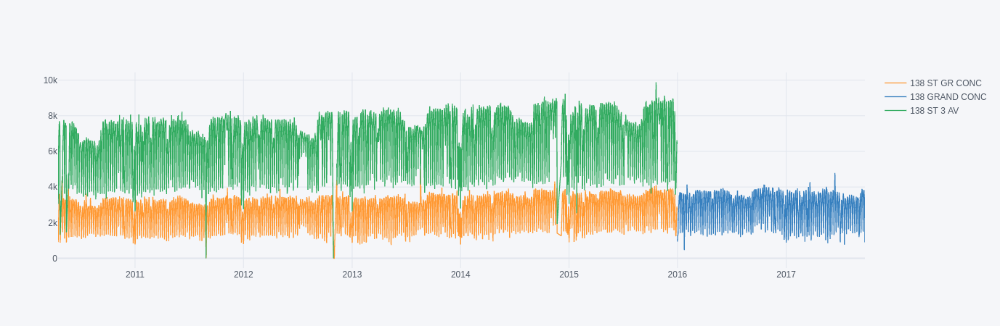

In [44]:
df_station.loc[['138 ST GR CONC', '138 GRAND CONC', '138 ST 3 AV']]['entries'].unstack(level='station').iplot()

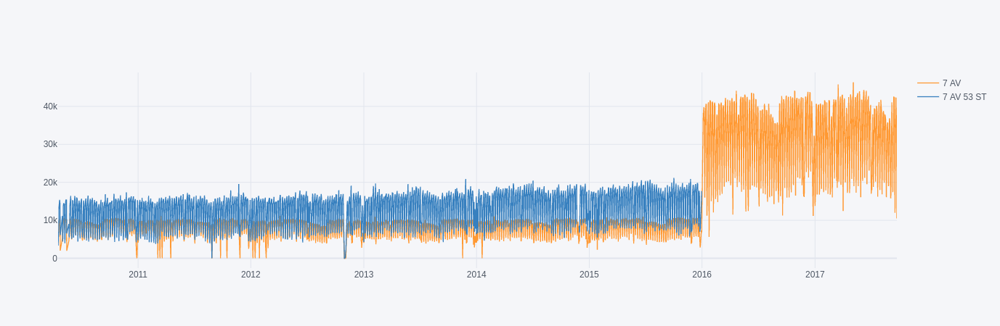

In [49]:
df_station.loc[['7 AV', '7 AV 53 ST']]['entries'].unstack(level='station').iplot()

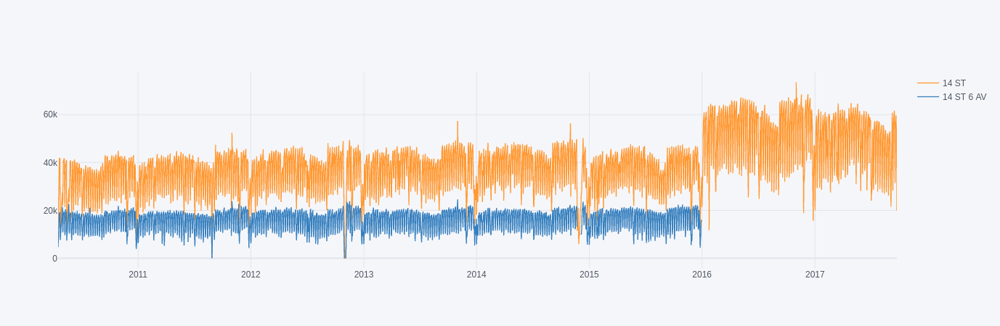

In [45]:
df_station.loc[['14 ST', '14 ST 6 AV']]['entries'].unstack(level='station').iplot()

The examples above demonstrates difficult to aggregate data by station. Sometimes they change names and this introduces bias as level (mean value) for the series changes abruptly or even terminates. From [mta website](http://web.mta.info/nyct/facts/ridership/ridership_sub_annual.htm) I was able to extract top-level regions for each station. In this way I simplify my analysis introducing another hierarchy level, that still makes sense.

In [116]:
from common import df_stations_to_regions

df_regions = df_stations_to_regions()
df_regions.head(5)

,station,region
0,138 ST GRAND CONCOURSE,The Bronx
1,149 ST GRAND CONCOURSE,The Bronx
2,161 ST YANKEE STADIUM,The Bronx
3,167 ST,The Bronx
4,170 ST,The Bronx


In [118]:
df_turnstiles_reg = (
    df_turnstiles
        .reset_index()
        .merge(df_regions)
        .set_index(['turnstile', 'time'])
)

NameError: name 'gc' is not defined

In [121]:
df_turnstiles_reg.head(5)

,,entries,exits,station,linename,division,remote,ca,region
turnstile,time,,,,,,,,
A006-R079-00-00-00,2015-01-01,700.0,1356.0,5 AV 59 ST,NQR,BMT,R079,A006,Manhattan
A006-R079-00-00-01,2015-01-01,722.0,541.0,5 AV 59 ST,NQR,BMT,R079,A006,Manhattan
A006-R079-00-00-02,2015-01-01,578.0,234.0,5 AV 59 ST,NQR,BMT,R079,A006,Manhattan
A006-R079-00-00-03,2015-01-01,556.0,175.0,5 AV 59 ST,NQR,BMT,R079,A006,Manhattan
A006-R079-00-00-04,2015-01-01,505.0,176.0,5 AV 59 ST,NQR,BMT,R079,A006,Manhattan


In [122]:
df_regions_agg = df_turnstiles_reg.groupby(['region', 'time'])['entries'].sum()

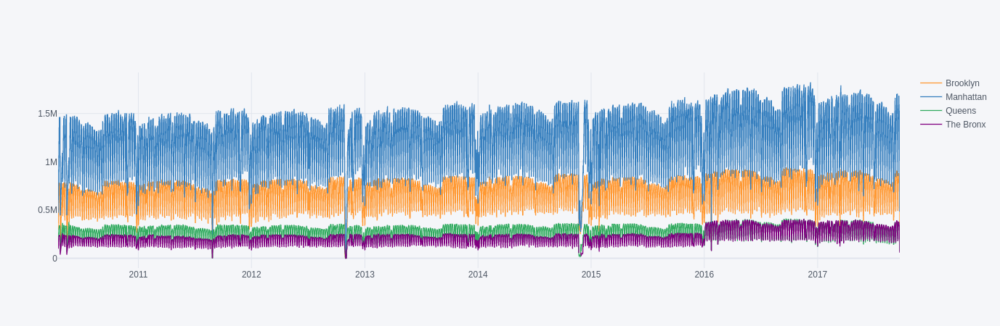

In [124]:
df_regions_agg.unstack(level='region').iplot()

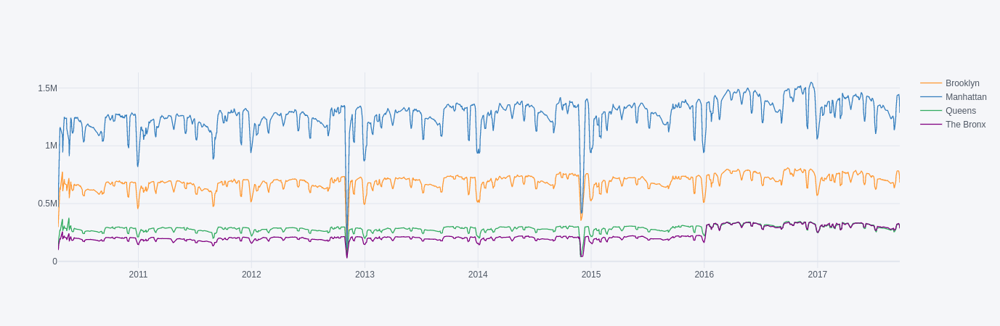

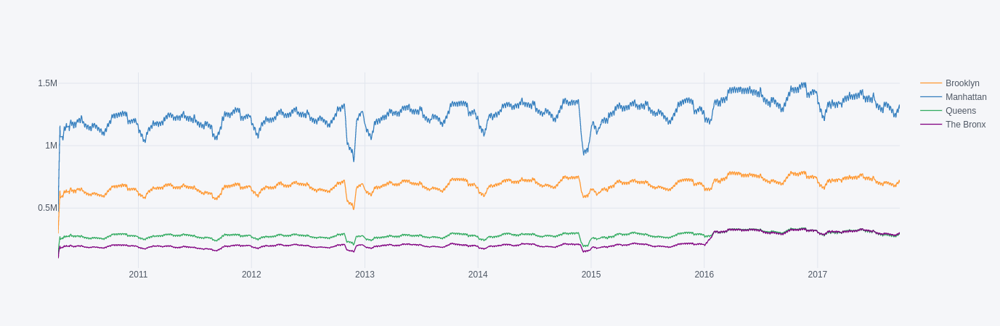

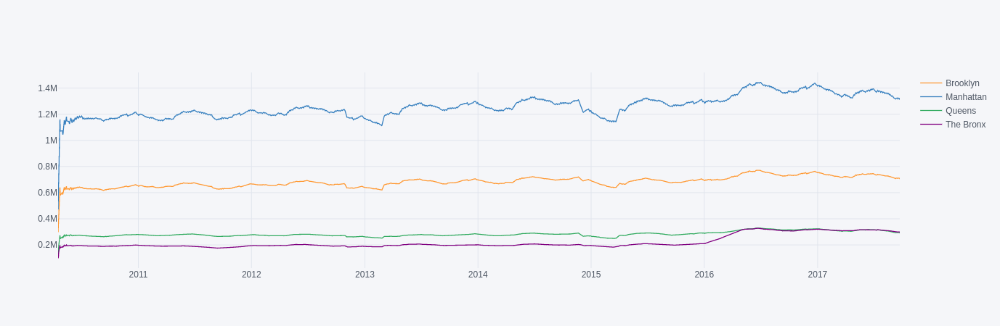

In [126]:
df_regions_agg.unstack(level='region').rolling('7D').mean().iplot()
df_regions_agg.unstack(level='region').rolling('30D').mean().iplot()
df_regions_agg.unstack(level='region').rolling('120D').mean().iplot()

Now that we are descending in hierarchy level we can see how things evolved for each node in our tree. Manhattan has the highest level of users, and apparently an increase in last years. Something happening in Bronx that their levels went up in 2017 to match for Queen region.

<AxesSubplot:xlabel='time'>

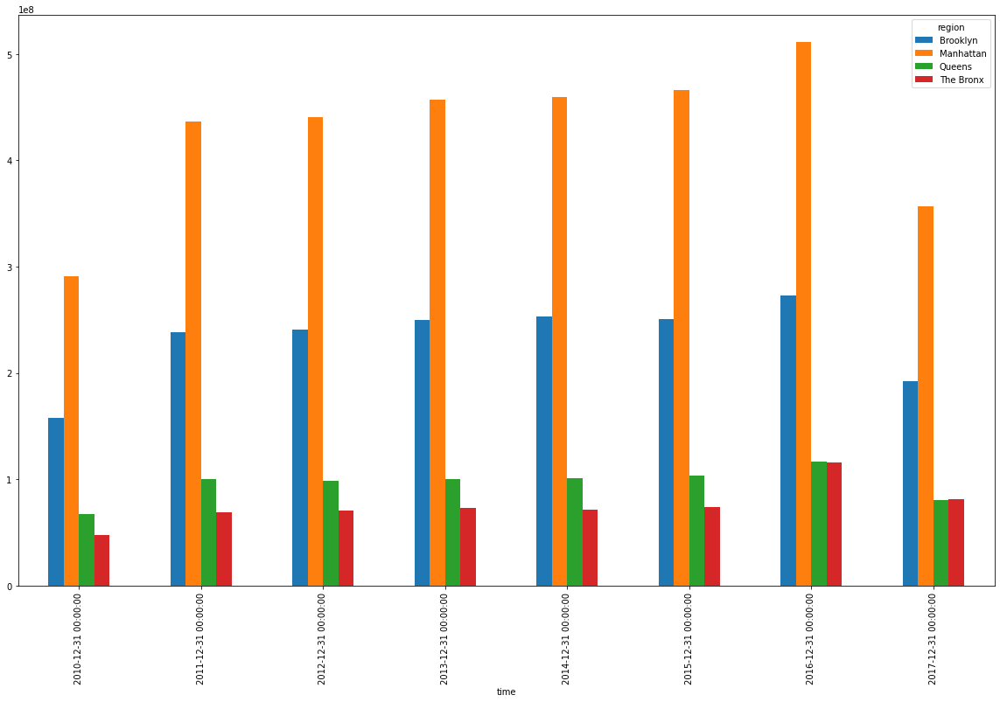

In [136]:
df_regions_agg.groupby([pd.Grouper(freq='Y', level='time'), 'region']).sum().unstack(level='region').plot.bar(stacked=False, figsize=(20, 12))

In [138]:
df_regions_agg.groupby([pd.Grouper(freq='Y', level='time'), 'region']).sum().unstack(level='region') / 1_000_000

region,Brooklyn,Manhattan,Queens,The Bronx
time,,,,
2010-12-31,157.483138,290.887212,67.354672,47.763654
2011-12-31,238.294623,436.595678,100.111845,68.444106
2012-12-31,240.801963,440.295813,98.629310,70.718160
2013-12-31,250.082230,457.419201,100.475233,73.014275
2014-12-31,253.282411,459.704491,100.650660,71.053773
2015-12-31,250.248325,466.189311,103.172951,74.075017
2016-12-31,272.426182,511.030795,116.611696,115.482482
2017-12-31,191.858835,356.593513,80.619117,81.557557


The information above differs from offical website, likely due stations not being mapped to correct regions. Since this is a case and not an official project, I will keep in this ways, the important aspect is that their aggregate level makes coherent sense, so we can model this as a hierarchical time series. Using station the way it was above, making predictions for individual stations would be problematic because of abrupt changes or even absence of data for some period.

## Remote-CA Series

Now we are going to end our exploration in remote-ca series.

In [143]:
df_remote_ca = (
    df_turnstiles
        .assign(remote_ca=lambda df: df['remote'] + "_" + df['ca'])
        .groupby(['remote_ca', 'time']).sum()
)

df_remote_ca.shape

(1091840, 2)

Which are the most used remotes and where they are located?df_regions_agg.groupby([pd.Grouper(freq='Y', level='time'), 'region']).sum().unstack(level='region')

In [ ]:
top_5_remote_ca = df_remote_ca.groupby(['remote_ca